# 0.0 Imports and directories

In [74]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import os
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn import metrics
from sklearn.mixture import GaussianMixture
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

In [2]:
BASE_DIR = os.path.dirname(os.path.dirname(os.path.abspath('__file__')))
DATA_DIR = os.path.join(BASE_DIR, 'feature_eng', 'data')

# 1.0 EDA

In [3]:
df = pd.read_csv(os.path.join(DATA_DIR, 'ft_df.csv'))
full_df = pd.read_csv(os.path.join(DATA_DIR, 'full_df.csv'))

In [4]:
df = df.dropna()

## 1.1 Univariate Analysis

What do we want to look at in this pandas profile?
1.  Variables with a disperse distribution (won't suit this data since it's an ecommerce dataset)
2. Metrics:
    - Min, Max, Range (dispersion)
    - Mean vs Median
    - Std and variance
    - var coef.

In [5]:
profile = ProfileReport(df)
#profile.to_file('output.html')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 1.1.1 Avg Basket Size

In [6]:
df[df.avg_basket_size == 40498.5]

,customer_id,avg_recency_days,avg_basket_size,avg_unique_basket_size,gross_revenue,qt_returns,last_purchase,orders,qt_products,qt_items,frequency,average_ticket


In [7]:
full_df[full_df.customer_id == 16446]

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id


### 1.1.2 Qt items

In [8]:
df[df.qt_items == 196844]

,customer_id,avg_recency_days,avg_basket_size,avg_unique_basket_size,gross_revenue,qt_returns,last_purchase,orders,qt_products,qt_items,frequency,average_ticket
1017,14646,7.844444,2733.944444,9.708333,279138.02,288.0,1.0,72.0,2060.0,196844.0,0.20339,3876.916944


In [9]:
full_df[full_df.customer_id == 14646].head(30)

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id
37613,539491,21981,12,2016-12-18,0.29,Netherlands,14646
37614,539491,21986,12,2016-12-18,0.29,Netherlands,14646
37615,539491,22720,2,2016-12-18,4.95,Netherlands,14646
37616,539491,21931,1,2016-12-18,1.95,Netherlands,14646
37617,539491,22613,2,2016-12-18,0.85,Netherlands,14646
37618,539491,20751,1,2016-12-18,2.10,Netherlands,14646
37619,539491,21246,2,2016-12-18,4.95,Netherlands,14646
37620,539491,22960,1,2016-12-18,4.25,Netherlands,14646
37621,539491,22355,2,2016-12-18,0.85,Netherlands,14646
37622,539491,21123,2,2016-12-18,1.25,Netherlands,14646


### 1.1.3 frequency

In [10]:
df[df.frequency == 17]

,customer_id,avg_recency_days,avg_basket_size,avg_unique_basket_size,gross_revenue,qt_returns,last_purchase,orders,qt_products,qt_items,frequency,average_ticket
0,17850,35.5,50.970588,0.617647,5391.21,40.0,372.0,34.0,297.0,1733.0,17.0,158.565


In [11]:
full_df[full_df.customer_id == 17850].invoice_date.value_counts()

2016-11-30    213
2016-11-29     84
2017-02-08     15
Name: invoice_date, dtype: int64

### 1.1.4 average_ticket

In [12]:
df[df.average_ticket == 84236.25]

,customer_id,avg_recency_days,avg_basket_size,avg_unique_basket_size,gross_revenue,qt_returns,last_purchase,orders,qt_products,qt_items,frequency,average_ticket


In [13]:
full_df[full_df.customer_id == 16446]

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id


## 1.2 Bivariate Analysis

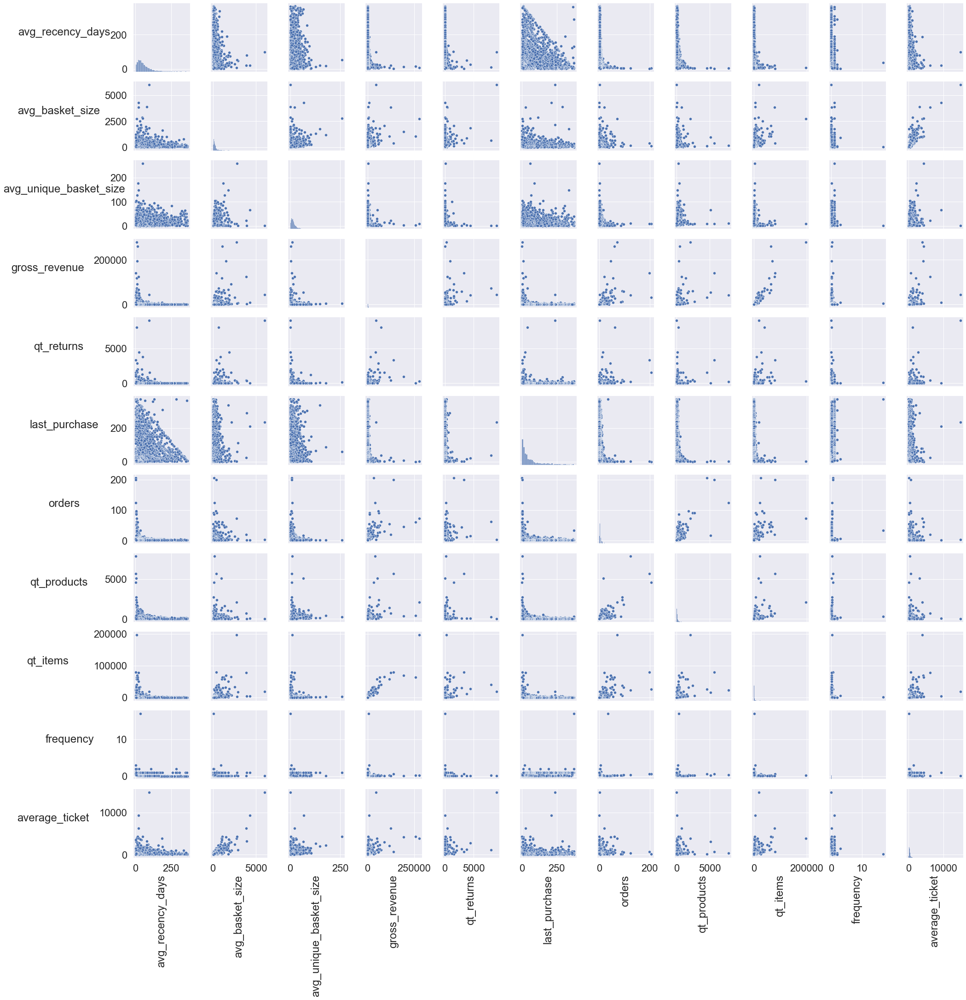

In [14]:
plot_df = df.drop(columns = 'customer_id')

sns.set(rc={'figure.figsize':(100,40)}, font_scale = 2)

g = sns.pairplot(plot_df)
for ax in g.axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.labelpad = 100

**Notes**
1. Frequency has low variance
2. Avg ticket has low variance

## 1.3 Space study

### 1.3.1 PCA

In [15]:
scaler = MinMaxScaler()
space_df = df.drop(columns = 'customer_id')

In [16]:
for col in space_df.columns:
    space_df[col] = scaler.fit_transform(space_df[[col]])
    
X = space_df.copy()

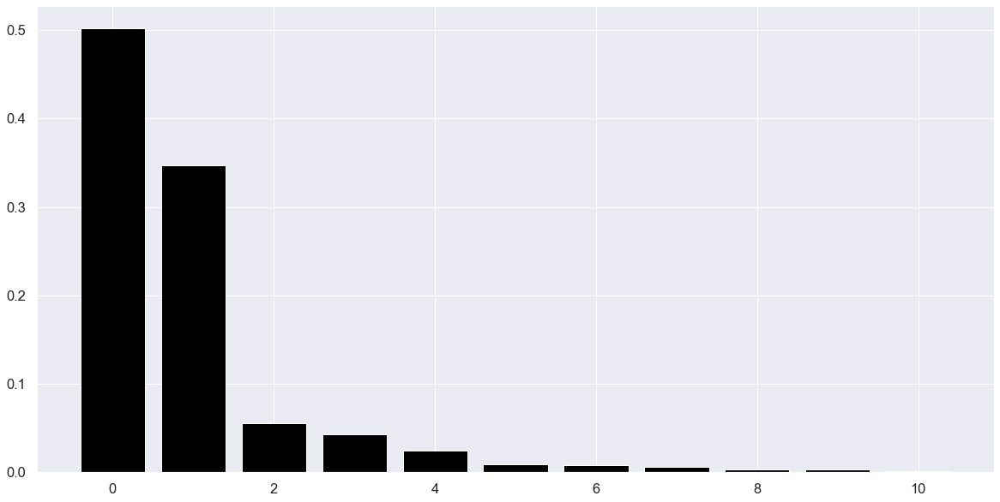

In [17]:
pca = PCA(n_components = X.shape[1])
principal_components = pca.fit_transform(X)

sns.set(rc={'figure.figsize':(20,10)}, font_scale = 1.5)

# plot explained variable
features = range( pca.n_components_ )

plt.bar( features, pca.explained_variance_ratio_, color='black' )

# pca component
df_pca = pd.DataFrame( principal_components )

In [18]:
df_pca.head()

,0,1,2,3,4,5,6,7,8,9,10
0,0.855645,-0.020427,0.029889,0.138093,-0.118872,-0.068907,-0.081373,0.960329,0.010449,-0.007852,0.001698
1,-0.009891,-0.112780,-0.019941,0.015057,-0.005736,-0.003165,-0.000415,-0.005992,0.000918,0.005991,-0.000391
2,-0.154100,-0.144900,0.002413,0.043589,0.004770,-0.001562,-0.014242,-0.000728,-0.012347,0.000126,-0.002057
3,0.074416,0.078209,-0.044133,0.037443,0.005727,0.000679,-0.000197,-0.005852,-0.000853,0.002806,-0.000619
4,0.734557,-0.076836,-0.042430,0.052046,-0.005008,0.002014,0.002876,-0.028198,0.004894,0.009627,-0.003361


<AxesSubplot:xlabel='0', ylabel='1'>

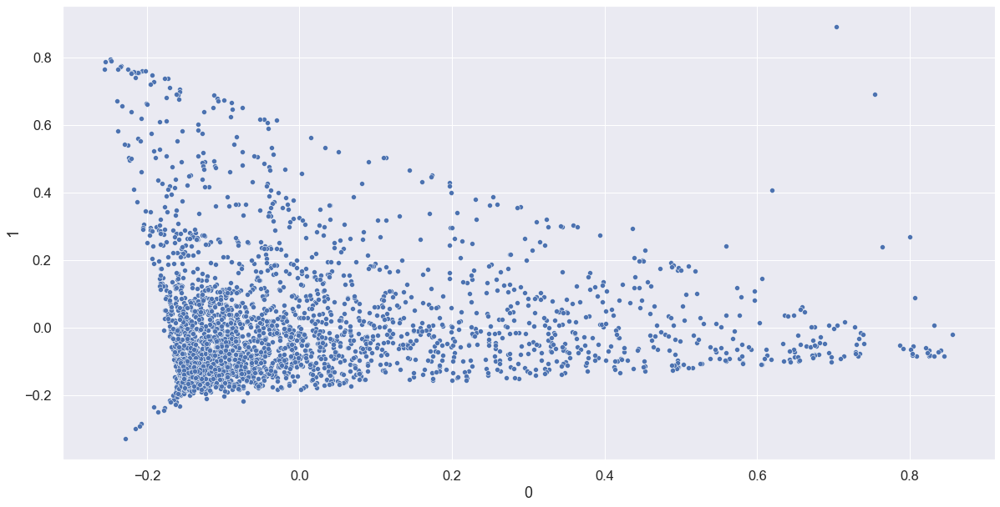

In [19]:
sns.scatterplot(x = 0, y = 1, data = df_pca)


### 1.3.2 Umap

<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

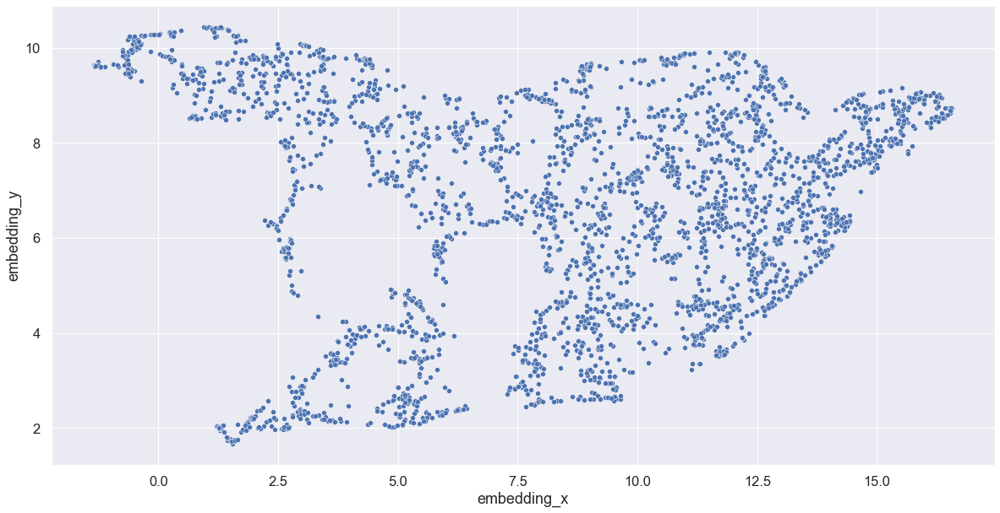

In [20]:
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]


# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_pca )

### 1.3.3 TSNE

<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

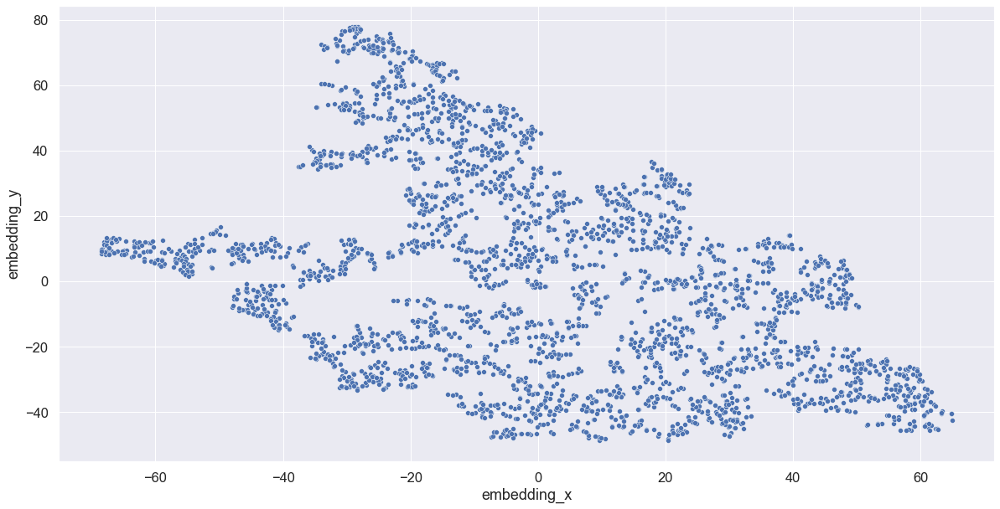

In [21]:
reducer = TSNE(n_components = 2,
                    n_jobs = -1,
                    random_state=42 )

embedding = reducer.fit_transform( X )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]


# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_pca )

### 1.3.4 Tree-based Embedding

In [22]:
X = df.drop(columns = ['customer_id', 'gross_revenue'])
y = df.gross_revenue

In [23]:
# model definition
rf = RandomForestRegressor(random_state=42 )

# model training
rf.fit( X, y )


# Leaf 

# dataframe Leaf

RandomForestRegressor(random_state=42)

In [24]:
df_leaf = pd.DataFrame(rf.apply(X))

In [25]:
df_leaf.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,2991,2714,3339,3338,2285,3134,3233,3126,3129,3327,...,3164,3220,3194,3030,3133,2975,3260,2822,3295,3307
1,2941,2787,3004,2841,2873,3085,2832,2674,3079,2936,...,2509,2874,2971,2898,3077,3088,2879,2675,2938,2866
2,3644,3599,3564,3578,3553,3637,3632,3550,3693,3605,...,3587,3444,3597,3484,3562,3487,3547,3614,3498,3633
3,1248,1260,1658,1352,1931,1150,2023,1346,1525,1808,...,1612,1331,2040,1799,1846,2104,1474,1188,1879,2104
4,399,593,585,152,564,698,453,298,1041,1186,...,1088,702,1235,336,1143,557,917,418,670,330


<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

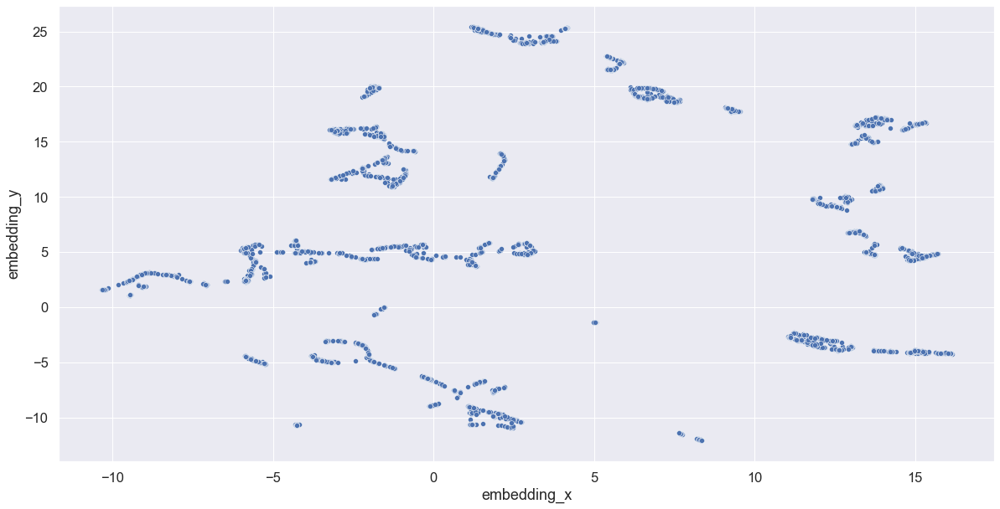

In [26]:
# Reduzer dimensionality
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( df_leaf )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]

# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_pca )

# 2.0 Data Prep

In [27]:
scaler = MinMaxScaler()
model_df = df.drop(columns = 'customer_id')

for col in space_df.columns:
    model_df[col] = scaler.fit_transform(model_df[[col]])

# 3.0 Feature Selection

# 4.0 Hyperparameter Fine-Tunning

In [28]:
X = model_df.copy()

clusters = range(2,8)

## 4.1 Kmeans

In [29]:
kmeans_list = []

for k in clusters:
    # model definition
    kmeans = KMeans( n_clusters= k )

    # model training
    kmeans.fit( X )

    # model predict
    labels = kmeans.predict( X )

    # model performance
    sil = metrics.silhouette_score( X, labels, metric='euclidean' )
    kmeans_list.append( sil )

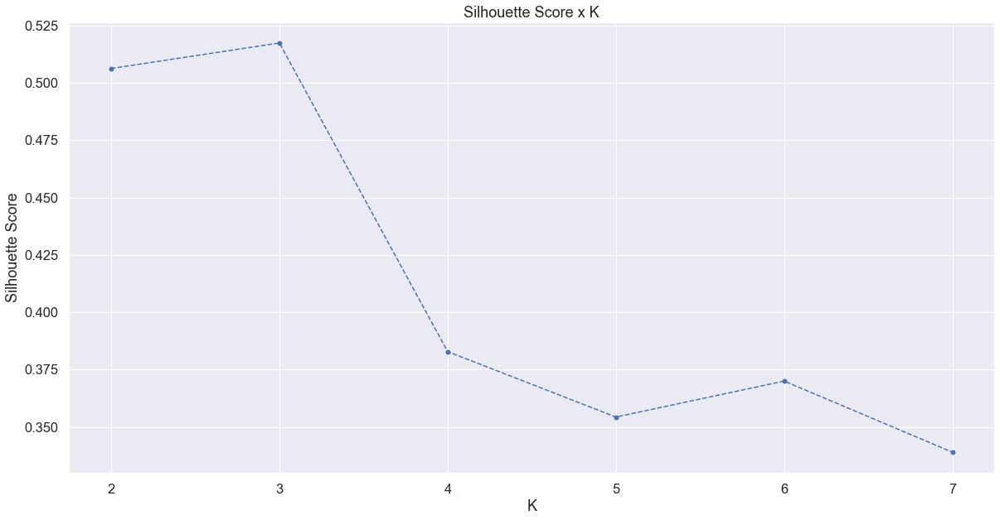

In [30]:
plt.plot( clusters, kmeans_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 4.2 GMM 

In [34]:
gmm_list = []

for k in clusters:
    # model definition
    gmm = GaussianMixture(n_components = k)

    # model training 
    gmm.fit(X)

    # model predict
    labels = gmm.predict(X)

    # model performance
    sil = metrics.silhouette_score( X, labels, metric='euclidean' )
    gmm_list.append( sil )

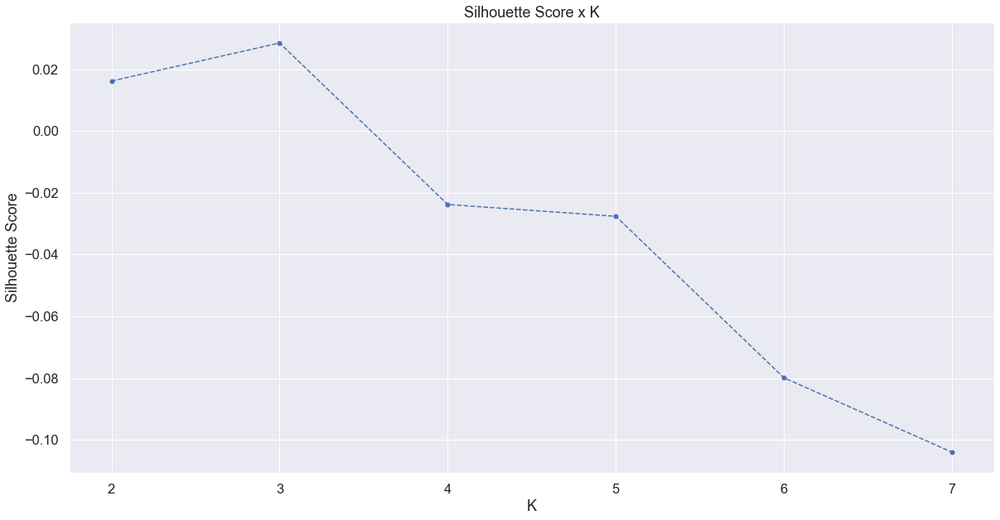

In [35]:
plt.plot( clusters, gmm_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 4.3 Hierarchical Clustering

In [45]:
# model definition and training 
hc = linkage(X, 'ward')

[]

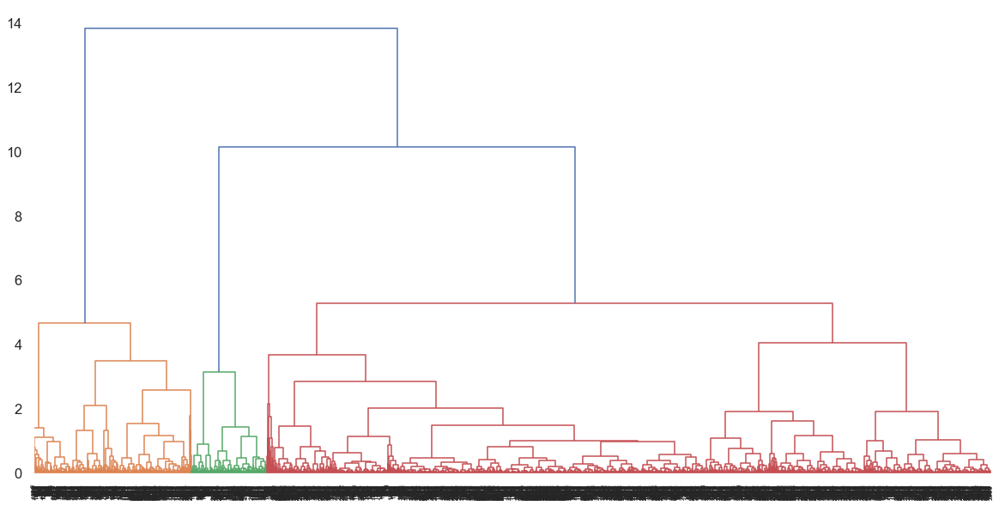

In [50]:
dendrogram(hc,
         leaf_rotation = 90,
         leaf_font_size = 8
         )

plt.plot()

[]

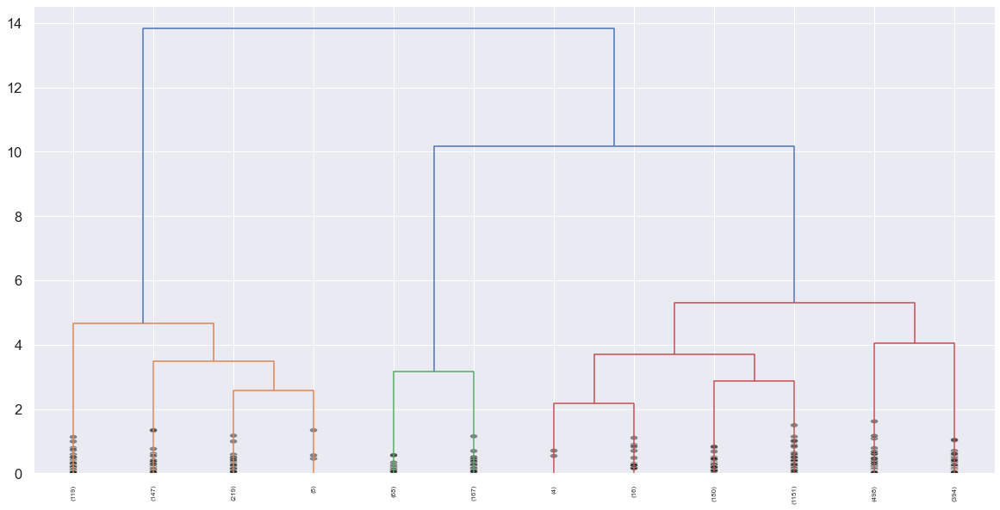

In [52]:
dendrogram(hc,
         truncate_mode = 'lastp',
         p = 12,
         leaf_rotation = 90,
         leaf_font_size = 8,
         show_contracted = True
          )

plt.plot()

### 4.3.1 HClustering Silhouette Score

In [58]:
hc_list = []
for k in clusters:

    # model training & definition
    hc = linkage(X, 'ward')

    # prediction 
    labels = fcluster( hc, k, criterion = 'maxclust' )

    # metrics
    sil = metrics.silhouette_score( X, labels, metric='euclidean' )
    hc_list.append(sil)

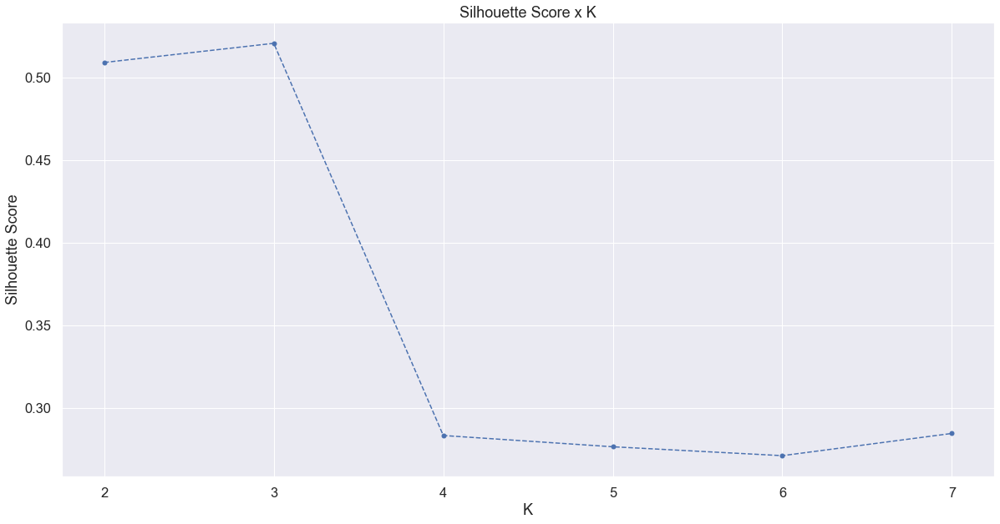

In [59]:
plt.plot( clusters, hc_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 4.4 DBSCAN

In [68]:
eps = 0.2
min_samples = 50

# model defintion
db_scan = DBSCAN(eps = eps, min_samples = min_samples)

# model training
labels = db_scan.fit_predict(X)

sil = metrics.silhouette_score(X, labels, metric = 'euclidean')
sil

0.5926290506175594

In [75]:
np.unique(labels)

array([-1,  0], dtype=int64)

In [76]:
neighbors = NearestNeighbors( n_neighbors = min_samples ).fit(X)
distances, index = neighbors.kneighbors(X)

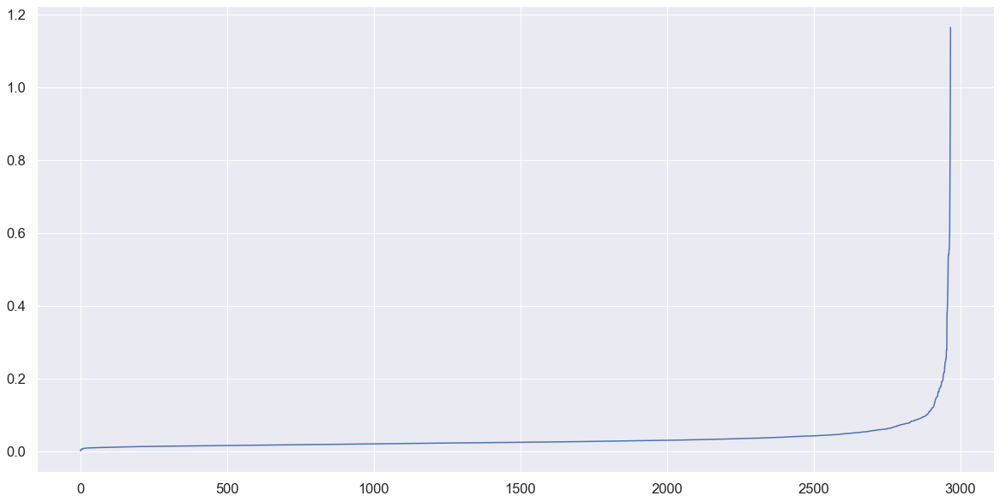

In [77]:
distances = np.sort(distances, axis = 0)[:,1]
plt.plot(distances)

## 4.5 Results

In [61]:
results = pd.DataFrame(
        {'Kmeans': kmeans_list,
        'Gmm': gmm_list,
        'HC': hc_list}
).T

results.columns = clusters

In [62]:
results.style.highlight_max(color = 'lightgreen', axis = 1)

,2,3,4,5,6,7
Kmeans,0.506186,0.517293,0.382880,0.354379,0.370039,0.339073
Gmm,0.016232,0.028566,-0.023763,-0.027596,-0.079915,-0.104027
HC,0.509416,0.521029,0.283263,0.276433,0.271043,0.284514
